<center>
    <h1>Denoising with diffusion models</h1>
    <h2>Project Work in Machine Learning for Computer Vision</h2>
    <h3>Enrico Pittini enrico.pittini@studio.unibo.it; Michele Calvanse michele.calvanese@studio.unibo.it</h3>
</center>



---



In this project we use different implementations of diffusion models to perform image denoising. For training we use the [Flowers102](https://www.robots.ox.ac.uk/~vgg/data/flowers/102/) dataset.

The concepts behind this project are explained in [Ho et al. 2020](https://arxiv.org/abs/2006.11239).

# Colab initialization
Run these cells only if you run this notebook as standalone in Colab.

In [ ]:
# For using the huggingface model
! pip install einops

In [ ]:
! git clone "https://github.com/EnricoPittini/denoising-diffusion-models"

In [ ]:
%cd -0
%cd "denoising-diffusion-models"

In [ ]:
# optional, if you want to save the checkpoints on google drive during training

from google.colab import drive
drive.mount('/content/gdrive')

! cd "gdrive/My Drive"
! mkdir "denoising-diffusion-models"
! cd "denoising-diffusion-models"

# Initialization

In [6]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('default')

import torch
from torchvision.transforms import Compose, ToTensor, RandomResizedCrop, RandomAffine, ColorJitter, RandomHorizontalFlip
from torchvision.datasets import CIFAR10, MNIST, Flowers102, ImageFolder
from torch.utils.data import DataLoader

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

import os

%load_ext autoreload
%autoreload 2

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device: %s' % device)

Device: cuda


In [8]:
# For reproducibility

import random
import torch

random_seed = 44

random.seed(random_seed)
np.random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)

torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

# Diffusion Dataset

We create a custom `DiffusionDataset` class, which enriches the standard `Flowers102` dataset by generating the noisy image after the forward diffusion process. In particular, each sample of `DiffusionDataset` is generated from a non-noisy image `x_0` from the original dataset. It consists of:
 - The couple `(x_noisy, t)`, where `t` is the timestep and `x_noisy` is the image plus the noise at that timestep. This couple can be thought as the input data of the network.
 - The `noise`, which has been added to the image at that timestep `t`. This can be thought of as the target label for the network.

In the forward diffusion process, the probability distribution $q$ of the noisy image $\mathbf{x_t}$ at timestep $t$ conditioned on the noisy image at timestep $t-1$ is:
\begin{equation}
    q(\mathbf{x}_t | \mathbf{x}_{t-1}) = \mathcal{N}(\mathbf{x}_t; \sqrt{1-\beta_t}\,\mathbf{x}_{t-1},\; \beta_t\, \mathbf{I}),
\end{equation}
where $\beta_t$ is the **variance schedule**, which defines the variance at each timestep. Since each forward diffusion step is a Gaussian distribution, we can derive the image $\mathbf{x}_t$ conditioned on the original image $\mathbf{x}_0$:
\begin{equation}
    q(\mathbf{x}_t | \mathbf{x}_0) = \mathcal{N}(\mathbf{x}_t; \sqrt{\bar{\alpha_t}}\, \mathbf{x}_0, \; (1 - \bar{\alpha_t})\, \mathbf{I})), \qquad \text{where} \quad \bar{\alpha}_t = \prod_{i=1}^{i=t} 1-\beta_i.
\end{equation}
This distribution is used in `DiffusionDataset` to generate `x_noisy`. In particular, the following formula is used.
\begin{equation}
    \mathbf{x}_t = \sqrt{\bar{\alpha}_t} \mathbf{x}_0 + \sqrt{1-\bar{\alpha}_t} \epsilon_t, 
\end{equation}
where $\epsilon_t$ is the added noise at that timestep, drawn by $\mathcal{N}(0,1)$.

As variance schedule we use a linearly increasing sequence from $0$ to $5\cdot 10^{-3}$ in $T=1000$ steps.


In [9]:
from utils.diffusionDataset import DiffusionDataset

image_size = (128, 128)
batch_size = 32 #16
batch_size_eval = 2*batch_size

variance_schedule = np.linspace(0, 5e-3, 1000)

Data augmentation is used in the training set. In particular, the following operation are performed:
- color jittering;
- random horizontal flip;
- random affine (i.e. rotation and scaling).

In the training set, each time an original image `x_0` is sampled, a different random timestep `t` is used for generating `x_noisy`. So, across different sampling and batches, the same image is affected by different degrees of noise.
In the validation and test sets, each image `x_0` has a random but fixed timestep `t`, which is the same each time that image is sampled, for generating the same `x_noisy`. So, across different sampling and batches, the same image is affected by the same degree of noise.  

Training set

In [10]:
# We use the test set as training set, and the training set as test set. This because the actual test set has more samples than the training one.

dataset_train = Flowers102(root='datasets', split='test',
                  download=True)

print(f'Number of training samples: {len(dataset_train)}')

dataset_train_diff = DiffusionDataset(data=dataset_train,
                           variance_schedule=variance_schedule,
                           transform=Compose([ToTensor(),
                                            RandomResizedCrop(image_size),
                                            ColorJitter(brightness=.2, hue=.2),
                                            RandomHorizontalFlip(),
                                            RandomAffine(degrees=(-180, 180), translate=(0.1, 0.1), scale=(0.8, 1.2))]),
                           random_seed=random_seed)

dataloader_train = DataLoader(dataset_train_diff,
                         batch_size=batch_size,
                         pin_memory=True,
                         shuffle=True)

  0%|          | 0/344862509 [00:00<?, ?it/s]

Extracting datasets/flowers-102/102flowers.tgz to datasets/flowers-102


  0%|          | 0/502 [00:00<?, ?it/s]

  0%|          | 0/14989 [00:00<?, ?it/s]

Number of training samples: 6149


Validation set

In [11]:
dataset_val = Flowers102(root='datasets', split='val',
                  download=True)

print(f'Number of validation samples: {len(dataset_val)}')

dataset_val_diff = DiffusionDataset(data=dataset_val,
                           variance_schedule=variance_schedule,
                           transform=Compose([ToTensor(),
                                            RandomResizedCrop(image_size)]),
                           random_seed=random_seed,
                           validation=True)

dataloader_val = DataLoader(dataset_val_diff,
                         batch_size=batch_size_eval)

Number of validation samples: 1020


Test set

In [12]:
dataset_test = Flowers102(root='datasets', split='train',
                  download=True)

print(f'Number of test samples: {len(dataset_test)}')

dataset_test_diff = DiffusionDataset(data=dataset_test,
                           variance_schedule=variance_schedule,
                           transform=Compose([ToTensor(),
                                            RandomResizedCrop(image_size)]),
                           random_seed=random_seed)

dataloader_test = DataLoader(dataset_test_diff,
                         batch_size=batch_size)

Number of test samples: 1020


## Have a look at some elements in the dataset

Forward diffusion step at stage t = 667.


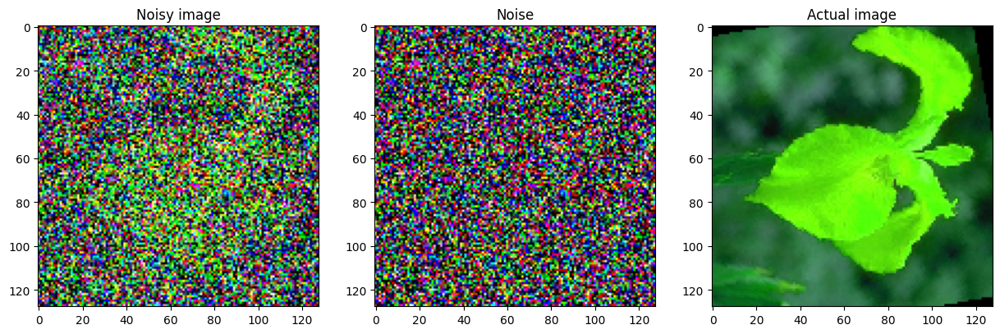

In [13]:
from utils.reconstruction import reconstruct_image_from_noise

(im_n, t), noise = next(iter(dataloader_train))
im_n = im_n[0]
t = t.numpy()[0]
noise = noise[0]

im = reconstruct_image_from_noise(im_n, noise, t, variance_schedule)

print(f"Forward diffusion step at stage t = {t}.")

w, h, dpi = 1500, 500, 100
fig, ax = plt.subplots(ncols=3, figsize=(w/dpi, h/dpi), dpi=dpi)

ax[0].imshow(im_n.permute(1, 2, 0).clip(0, 1))
ax[0].set_title('Noisy image')
ax[1].imshow(noise.permute(1, 2, 0).clip(0, 1))
ax[1].set_title('Noise')
ax[2].imshow(im.permute(1, 2, 0).clip(0, 1))
ax[2].set_title('Actual image')
plt.show()

## Plot the variance schedule and $\bar{\alpha}$

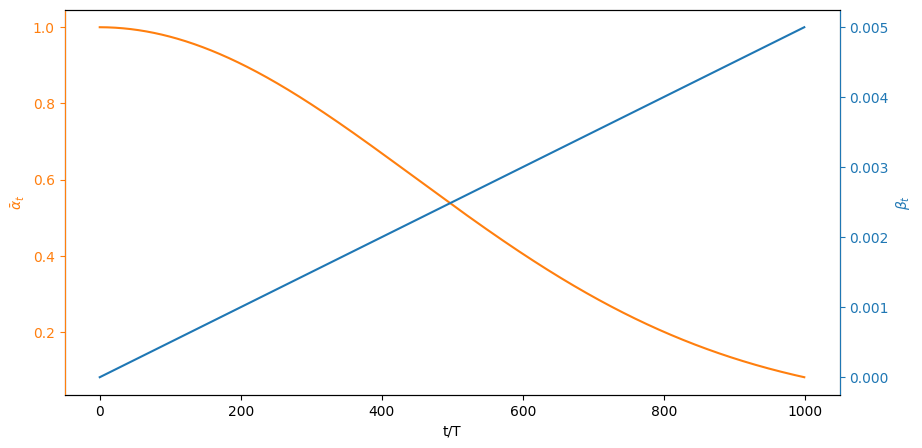

In [14]:
from utils.diffusionDataset import get_alpha_bar

T = 1000
t = np.arange(T+1)
s = 1e-3

alpha_bar = get_alpha_bar(variance_schedule)

w, h, dpi = 1000, 500, 100
fig, ax1 = plt.subplots(figsize=(w/dpi, h/dpi), dpi=dpi)
ax2 = ax1.twinx()

ax1.set_xlabel('t/T')

color = 'C1'
ax1.plot(alpha_bar, color=color)
ax1.set_ylabel(r'$\bar{\alpha}_t$', color=color)
ax2.spines['left'].set_color(color)
ax1.tick_params(axis='y', colors=color)

color = 'C0'
ax2.plot(variance_schedule, color=color)
ax2.set_ylabel(r'$\beta_t$', color=color)
ax2.spines['right'].set_color(color)
ax2.tick_params(axis='y', colors=color)

plt.show()

# Diffusion model

A diffusion model is a neural network which tries to estimate the probability distribution of $x_{t-1}$ given $x_t$, namely $q(x_{t-1}|x_t)$. This is the so-called **reversed process** or **backward process**. This reversed conditional probability is assumed to be Gaussian as well, reaching the following formula for the estimated parametrized conditional distribution:
\begin{equation}
    p_{\theta}(\mathbf{x}_{t-1} | \mathbf{x}_{t}) = \mathcal{N}(\mathbf{x}_{t-1}; \; \mu_{\theta}(\mathbf{x}_{t},t) ,\; \Sigma_{\theta}(\mathbf{x}_{t},t)),
\end{equation}
where both the mean $\mu_{\theta}(\mathbf{x}_{t},t)$ and the variance $\Sigma_{\theta}(\mathbf{x}_{t},t))$ are computed by the model. Now, following the paper [Ho et al. 2020](https://arxiv.org/abs/2006.11239), we assume the variance as fixed: $\Sigma_{\theta}(\mathbf{x}_{t},t)) = \sigma_t$. Thus, we compute only the mean. Furthermore, we reparametrize the mean such that we make the model estimate the added noise $\epsilon_{\theta}(\mathbf{x}_{t},t)$, with the following formula. 
\begin{equation}
    \mu_{\theta}(\mathbf{x}_{t},t) = \frac{1}{\sqrt{1-\beta_t}} (\mathbf{x}_{t} - \frac{\beta_t}{\sqrt{1-\bar{\alpha}_t}} \epsilon_{\theta}(\mathbf{x}_{t},t))
\end{equation}
So, in our work, a diffusion model is simply a model which takes in input the noisy image $\mathbf{x}_{t}$ and the timestep $t$ and it returns the predicted added noise $\epsilon_{\theta}(\mathbf{x}_{t},t)$.

The loss function is simply the *MSE* between the true added noise and the predicted one: 
\begin{equation}
    ||\epsilon - \epsilon_{\theta}(\mathbf{x}_{t},t)||^2
\end{equation}
This is the metric used both for training and evaluation.

# Approach

In this section, we describe the different alternatives that we have tried and the resulting best one.

## Neural networks

We have tried two different implementations of a UNet-based diffusion model. 
- **Custom diffusion models**. These are models implemented from scratch by us. They are classic UNets, in which each downsampling, intermediate and upsampling stage is a residual block. The timestep `t` is processed using positional encoding into a certain number of channels: these channels are concatenated with the input image and passed through an initial convolutional layer, or summed to the spatial activation after an initial convolution. The resulting activations are then given to the different variations of the UNet.
- **Huggingface model**. This model has been taken from [here](https://huggingface.co/blog/annotated-diffusion). It's a classic UNet, in which each downsampling and upsampling stage is one or two residual blocks plus linear attention and group normalization. The intermediate part consists of one residual block plus linear attention and group normalization plus another residual block. Also here the timestep is processed at the beginning using positional encoding. The only difference with the original implementation from *huggingface* is that we use linear attention instead of the quadratic one in the intermediate part (for efficiency reasons). 

## Custom models

In this sub-section we briefly describe all the variations of our custom models, located in `models/custom_models.py`.

All of our custom models are variations of `UNet` with `ResNet` blocks in the deepest part of the UNet. These are:
 - `UNetResNet`: the baseline model. It uses strided convolutions for down- and upsampling. The positional encoding of the timestep is concatenated to the spatial activation after an initial convolution;
 - `UNetResNetSum`: instead of being concatenated, the positional encoding of the timestep is summed to the spatial channels after the first convolution.

These two models tend to produce checkerboard patters due to the strided convolutions in the downsampling and upsampling parts. UNetResNet tends to produce better looking results, so we choose to variate it to combat the checkerboard pattern formation. We try these variations:
 - `UNetResNetK2`: the kernel size of the first layer of each down- and upsampling block is to $2 \times 2$;
 - `UNetResNetFC`: we add an intermediate convolutional layer before the final one with a $3 \times 3$ kernel and half the number of channels in its output compared to its input;
 - `UNetResNetFixed`: the downsampling is fixed to `MaxPool` and the upsampling is done via bilinear interpolation.

Of these, `UNetResNetFixed` is the only one that is able to successfully remove the checkerboard pattern. The following example images are produced by `UNetResNet`, `UNetResNetFC` and `UNetResNetFixed` respectively:

![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/checkerboard_pattern_strided_convolution.jpg?raw=true)
![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/checkerboard_pattern_additional_convolution.jpg?raw=true)
![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/original_flower.jpg?raw=true)

We also tried using Attention layers, hoping to gain semantic knowledge about the image. Quadratic attention scales too much with the input size, so we had to use linear attention. The resulting model is `UNetResNetLinearAttention`. This results in poor performance, because the network enhances one of the channels of the image. This can be seen in these reconstructions:

![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/attention_flower_2.png?raw=true)
![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/attention_flower_2_nos.png?raw=true)

The second reconstruction uses data augmentation, which improves things a bit, but it is still much worse than the model variations without attention, so we do not use it.

We also want to see whether using bottleneck residual blocks improves performance compared to standard residual blocks. This is implemented in `UNetBottleneckResidual`. We find that it performs better than the baseline.

## Data augmentation

At first, we did not use data augmentation. Then, after introducing it, we saw a big improvement, both in the final results and in the training stability.

The following plot shows the results achieved by the `UNetBotteleneckResidual` without data augmentation:

![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/no_augm.jpg?raw=true)

And with data augmentation:

![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/augm.jpg?raw=true)

Both training runs use `AdamW` a constant learning rate of $10{-3}$.

## Training recipe

We have used $100$ epochs with batch size $32$, and optimizer `AdamW`. We have tried different learning rate schedules:
- constant learning rate.
- `OneCycleLR`, with percentage of warmup steps (i.e. batch steps) of $0.1$.
- `StepLR`, with step size equal to $20$ epochs and with gamma equal to $0.75$ (i.e. multiplicativity factor of each lr update).

As maximum learning rate in each of these schedules we have tried many different ones between $5 \cdot 10^{-4}$ and $10^{-2}$.

The following plot shows the training history of `UNetBotteleneckResidual`, using `OneCycleLR` with max lr equal to $5 \cdot 10^{-4}$.

![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/bott_res_train_hist.jpg?raw=true)

The final scores are the following:

| Training score | Validation score | Test score |
|----------------|------------------|------------|
| 0.0381         |      0.0350      |    0.0357  |


## Overall Best configuration

In the end, the best configuration we have found is the one which uses the `HuggingFaceModel`. 

The following plot shows the training history of this bottleneck model, using `OneCycleLR` with max lr equal to $5 \cdot 10^{-4}$.

![Alt text](https://github.com/EnricoPittini/denoising-diffusion-models/blob/main/images/hugg_train_hist.jpg?raw=true)

The final scores are the following:

| Training score | Validation score | Test score |
|----------------|------------------|------------|
| 0.0288         |      0.0255      |    0.0339  |



### Training
THIS CELL IS LEFT ONLY FOR ILLUSTRATIVE PURPOSES: LATER WE WILL LOAD THE BEST MODEL WITH THE PRE-TRAINED WEIGHTS. RUN THIS CELL ONLY IF YOU WANT TO TRAIN AGAIN THE MODEL.

Device: cuda
Loading checkpoint: checkpoints/FourthModel/checkpoint_0073_best.ckpt
Checkpoint loaded.
 
Epoch: 74/100
	Train 193/193, 302s 1563ms/step, lr: 9.61e-05, loss: 0.0279                           
	Val 16/16, 21s 1342ms/step, loss: 0.033                                             
Epoch: 75/100
	Train 193/193, 297s 1539ms/step, lr: 8.93e-05, loss: 0.0264                           
	Val 16/16, 21s 1339ms/step, loss: 0.03                                              
Epoch: 76/100
	Train 193/193, 299s 1551ms/step, lr: 8.27e-05, loss: 0.0276                           
	Val 16/16, 21s 1334ms/step, loss: 0.0281                                            
Epoch: 77/100
	Train 193/193, 296s 1534ms/step, lr: 7.63e-05, loss: 0.0281                           
	Val 16/16, 21s 1331ms/step, loss: 0.0274                                            
Epoch: 78/100
	Train 193/193, 295s 1531ms/step, lr: 7.01e-05, loss: 0.0278                           
	Val 16/16, 21s 1325ms/step, loss: 0.0308 

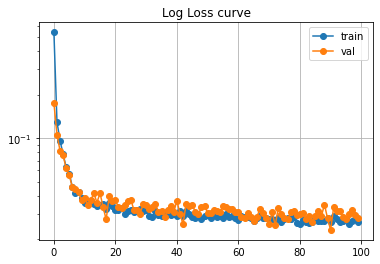

In [ ]:
from models.huggingface_model import HuggingFaceModel
from utils.training import train_model

from torch.optim.lr_scheduler import OneCycleLR
from torch.optim import AdamW
from functools import partial

net = HuggingFaceModel(dim=image_size[0], device=device, use_convnext=False, dim_mults=(1,2,4))

epochs = 100
additional_info = {'batch_size': batch_size,
                   'image_size': image_size,
                   'variance_schedule': variance_schedule
                  }

checkpoint_dict = train_model(net=net,
                              dataloader_train=dataloader_train,
                              dataloader_val=dataloader_val,
                              loss_function=torch.nn.MSELoss(),
                              epochs=epochs,
                              optimizer=partial(AdamW, lr=0.1),
                              scheduler=partial(OneCycleLR, max_lr=0.0005, epochs=epochs, steps_per_epoch=len(dataloader_train),
                                                pct_start =0.1),
                              device=device,
                              checkpoint_folder='checkpoints/' + f'{type(net)}'.split('.')[-1][:-2],
                              clear_previous_checkpoints=True,
                              additional_info=additional_info)

plt.plot(checkpoint_dict['loss_history'], 'o-', label='train')
plt.plot(checkpoint_dict['loss_history_val'], 'o-', label='val')
plt.yscale('log')
plt.grid()
plt.title('Log Loss curve')
plt.legend()

plt.show()

In [ ]:
# For showing only the training history plot

from utils.training import load_checkpoint_dict

checkpoint_dict = load_checkpoint_dict(checkpoint_folder='checkpoints/' + f'{type(net)}'.split('.')[-1][:-2])
plt.plot(checkpoint_dict['loss_history'], 'o-', label='train')
plt.plot(checkpoint_dict['loss_history_val'], 'o-', label='val')
plt.yscale('log')
plt.grid()
plt.title('Log Loss curve')
plt.legend()

plt.show()

### Loading the best model
RUN THESE CELLS ONLY IF YOU WANT TO LOAD THE BEST MODEL IN ORDER TO RUN THE FOLLOWING SECTIONS

Create the checkpoints folder and download the weigths

In [41]:
! mkdir 'checkpoints'
! mkdir 'checkpoints/HuggingFaceModel'

! wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=11yThv_q1zKVRt5JsfwghKLiDGFJjiVmP' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=11yThv_q1zKVRt5JsfwghKLiDGFJjiVmP" -O checkpoints/HuggingFaceModel/checkpoint_100_best.ckpt && rm -rf /tmp/cookies.txt

mkdir: cannot create directory ‘checkpoints’: File exists
mkdir: cannot create directory ‘checkpoints/HuggingFaceModel’: File exists
--2023-01-24 23:18:59--  https://docs.google.com/uc?export=download&confirm=t&id=11yThv_q1zKVRt5JsfwghKLiDGFJjiVmP
Resolving docs.google.com (docs.google.com)... 142.251.31.102, 142.251.31.139, 142.251.31.113, ...
Connecting to docs.google.com (docs.google.com)|142.251.31.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0c-6s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/637g1n2kii3tduk4q0q43qtugtqjdod4/1674602325000/02606428470391445399/*/11yThv_q1zKVRt5JsfwghKLiDGFJjiVmP?e=download&uuid=38bb5d39-9e65-4200-9cd2-8cf286ff2654 [following]
--2023-01-24 23:18:59--  https://doc-0c-6s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/637g1n2kii3tduk4q0q43qtugtqjdod4/1674602325000/02606428470391445399/*/11yThv_q1zKVRt5JsfwghKLiDGFJjiVmP?e=download&uuid=38bb5d39-

In [42]:
# Loading the best model

from models.huggingface_model import HuggingFaceModel
from utils.eval import reconstruct_and_compare
from utils.storage import load_weights

# net = BottleneckResidual(img_shape=(3,)+image_size, device=device)
net = HuggingFaceModel(dim=image_size[0], device=device, use_convnext=False, dim_mults=(1,2,4))
net_name = f'{type(net)}'.split('.')[-1][:-2]

files=os.listdir(f'checkpoints/{net_name}')
load_weights(net, f"checkpoints/{net_name}/{[f for f in files if 'best' in f][0]}")
net.to(device);

### Test set evaluation

In [43]:
# Test score on the flowers test set 

from utils.training import validate
test_score = validate(net=net,
          dataloader_val=dataloader_test,
          loss_function=torch.nn.MSELoss(),
          device=device,
          prefix='Test ')

Test 32/32, 23s 713ms/step, loss: 0.0276                                             


# Reconstruction

Given a noisy image $\mathbf{x}_t$ and its timestep $t$, we are able to predict the noise $\epsilon_{\theta}(\mathbf{x}_t,t)$ at timestep by means of our diffusion model. With this, we can reconstruct the non-noisy original image $\mathbf{x}_0$.

We have implemented three different ways of performing such reconstruction: single step, sequential and general.

## Single-step reconstruction

By reverting the equation $\mathbf{x}_t = \sqrt{\bar{\alpha}_t} \mathbf{x}_0 + \sqrt{1-\bar{\alpha}_t} \epsilon_t$, we achieve the following recontruction equation:
\begin{equation}
     \mathbf{x}_0 =  \frac{\mathbf{x}_t - \sqrt{1-\bar{\alpha}_t} \epsilon_{\theta}(\mathbf{x}_t,t)}{\sqrt{\bar{\alpha}_t}}
\end{equation}


## Sequential reconstruction
Following the paper [Ho et al. 2020](https://arxiv.org/abs/2006.11239), we can reconstruct $\mathbf{x}_0$ in a squential way. Given that the estimated conditional distribution of $\mathbf{x}_{t-1}$ given $\mathbf{x}_t$ is $\mathcal{N}(\mathbf{x}_{t-1}; \; \mu_{\theta}(\mathbf{x}_{t},t) ,\; \Sigma_{\theta}(\mathbf{x}_{t},t))$, we compute $\mathbf{x}_{t-1}$ starting from $\mathbf{x}_t$, using the following formula:
\begin{equation}
    \mathbf{x}_{t-1} = \frac{1}{\sqrt{1-\beta_t}} (\mathbf{x}_{t} - \frac{\beta_t}{\sqrt{1-\bar{\alpha}_t}} \epsilon_{\theta}(\mathbf{x}_{t},t)) + \sigma_t z,
\end{equation}
where z is a noise drawn from $\mathcal{N}(0,1)$.

We apply this formula iteratively, until reaching $t=0$.

We point out that for recontructing the images we did not use the variance term $\sigma_t z$: basically, we have fixed $\sigma_t = 0$ for each $t$.


## General reconstruction

In the middle between single step and sequential. We can specify a step size $S$: if $S=t$ we have single-step; if $S=1$ we have sequential. Basically, we perform a sequential reconstruction, in which each step has size $S$. 

Let $i$ be the index of the reconstruction step, going from $\lfloor t/S \rfloor$ down to $1$ ($\lfloor t / S \rfloor$, $\lfloor t / S - 1 \rfloor$, ..., $1$). For each $i$, the current timestep is $t_i$, while the next one is $t_{i-1}$. We compute $t_{i-1}$ as follows:
\begin{equation}
    \mathbf{x}_{t_{i-1}} = \frac{1}{\sqrt{\bar{\alpha}_{t_i}-\bar{\alpha}_{t_{i-1}}}} (\mathbf{x}_{t_i} - \frac{1-(\bar{\alpha}_{t_i}-\bar{\alpha}_{t_{i-1}})}{\sqrt{1-\bar{\alpha}_{t_i}}} \epsilon_{\theta}(\mathbf{x}_{t_i},t_i)) + \sigma_{t_i} z
\end{equation}
We apply this formula iteratively, until reaching $t=0$.

Also here, we did not use the variance term $\sigma_{t_i} z$: basically, we have fixed $\sigma_t = 0$ for each $t$.

# Qualitative analysis

Now we evaluate the goodness of our diffusion model in denoising some images, i.e. in reconstructing the original non-noisy one.

We compare different kinds of reconstructions: 
- baseline reconstruction, made with bilinear interpolation;
- reconstruction with step size equal to $1$;
- reconstruction with step size equal to $5$.

No significant difference is present between step size $1$ and $5$.

## Random image from the `Flowers102` test set

In [28]:
from utils.reconstruction import reconstruct_image_from_noise
from utils.eval import reconstruct_and_compare

(noisy_image_batch, t_batch), noise_batch = next(iter(dataloader_test))
i = np.argmin(t_batch.numpy())

noisy_image = noisy_image_batch.numpy()[i]
t = t_batch.numpy()[i]
noise = noise_batch.numpy()[i]

# true original image
original_image = reconstruct_image_from_noise(noisy_image=noisy_image,
                                              noise=noise,
                                              t=t,
                                              variance_schedule=variance_schedule)

orig_name = "flower"

print(f't = {t}')

t = 11


T start = 11
Sampling done.
T start = 11
Sampling done.
1200 1800



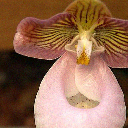
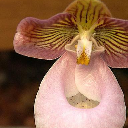
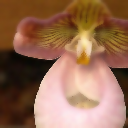
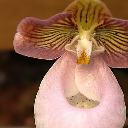
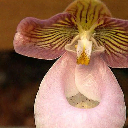

In [30]:
output_folder = f'test_pictures/{net_name}_{orig_name}_{t}'
step_size = [1, 5]
rec_images = reconstruct_and_compare(net, original_image, noisy_image, t, variance_schedule, device, output_folder=None, step_size=step_size, use_plotly=True)

## Ship image

This image is completely outside the `Flowers102` dataset. Nonetheless, our model is still able to denoise it.

In [31]:
from matplotlib import image
from utils.diffusionDataset import get_alpha_bar

original_image = np.asarray(image.imread('test_pictures/ship.jpg'), dtype=np.float32)/255
orig_name = "ship"

original_image = original_image.transpose(2, 0, 1)

image_size_test = original_image.shape[1:]

t = 50

a = get_alpha_bar(variance_schedule)[t]
noisy_image = np.sqrt(a)*original_image + np.sqrt(1-a)*np.random.normal(size=original_image.shape)
noisy_image = noisy_image.clip(0, 1)

T start = 50
Sampling done.
T start = 50
Sampling done.
original saved
noisy saved
baseline saved
step 1 saved
step 5 saved
1200 1800



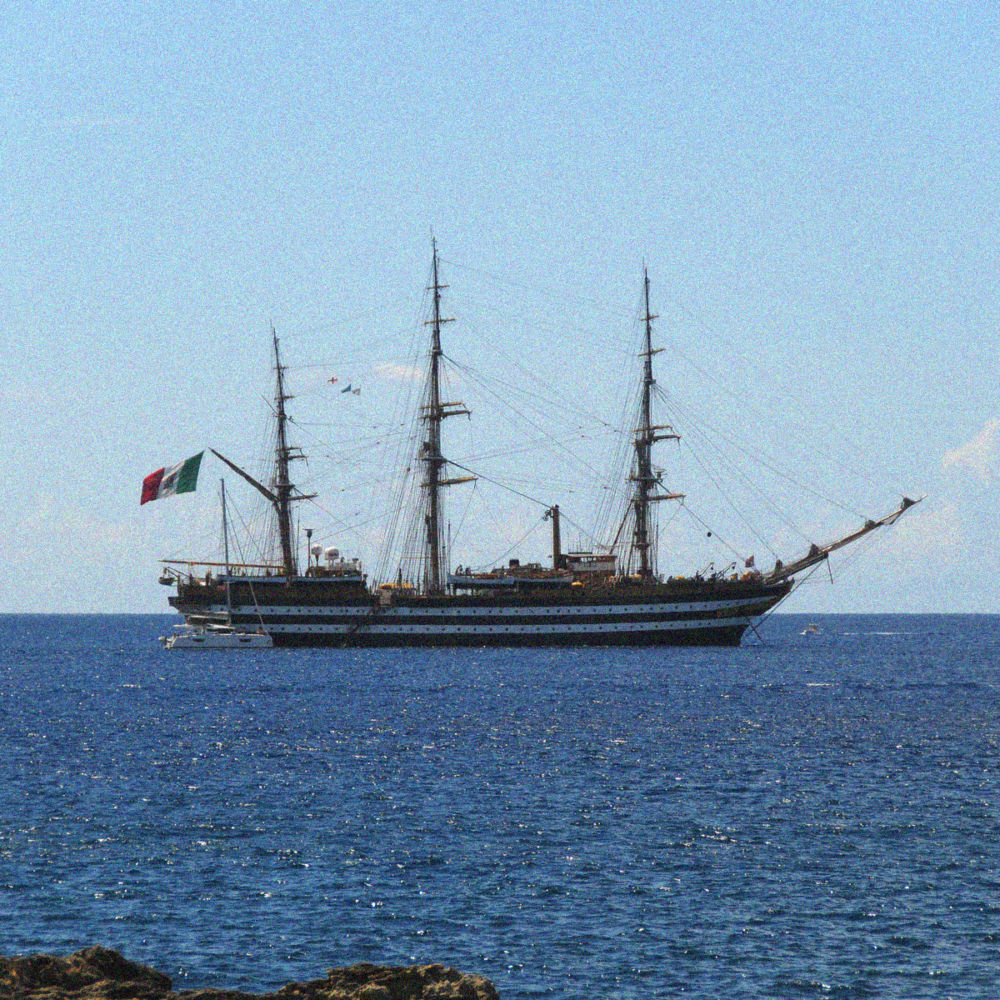
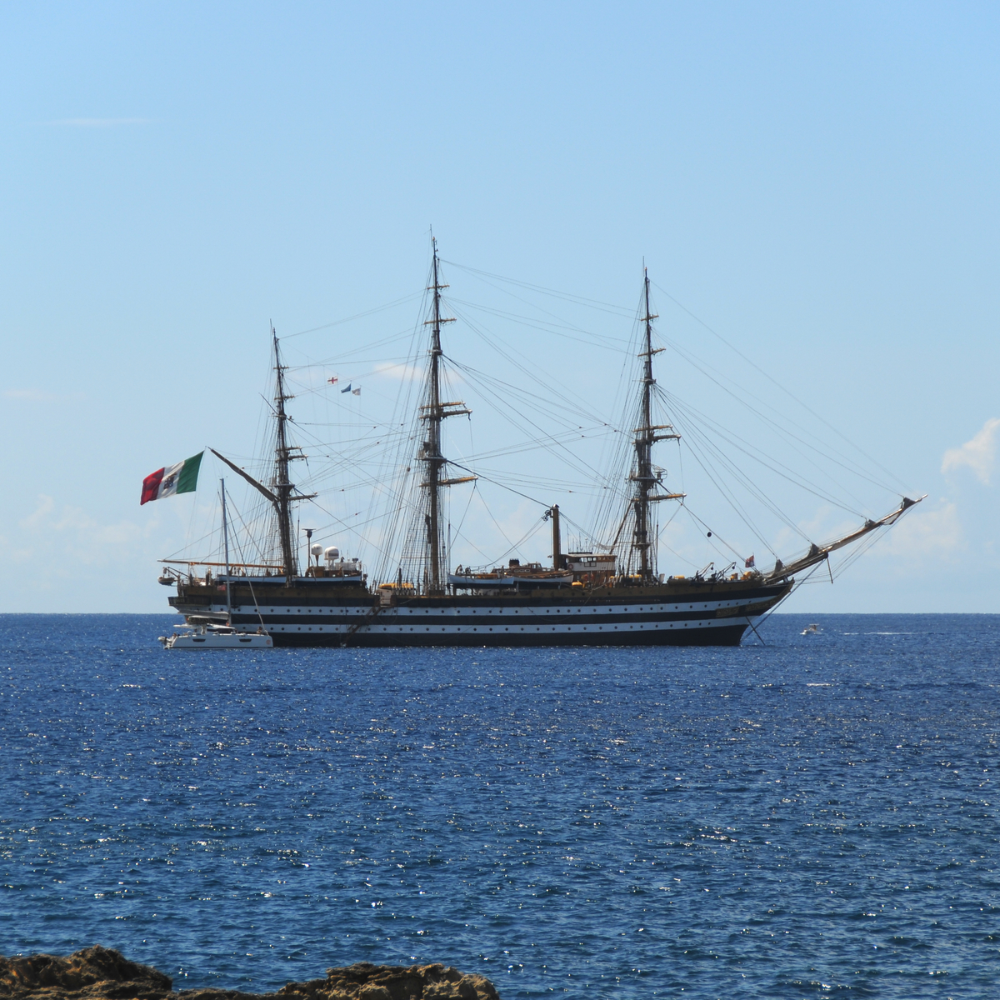
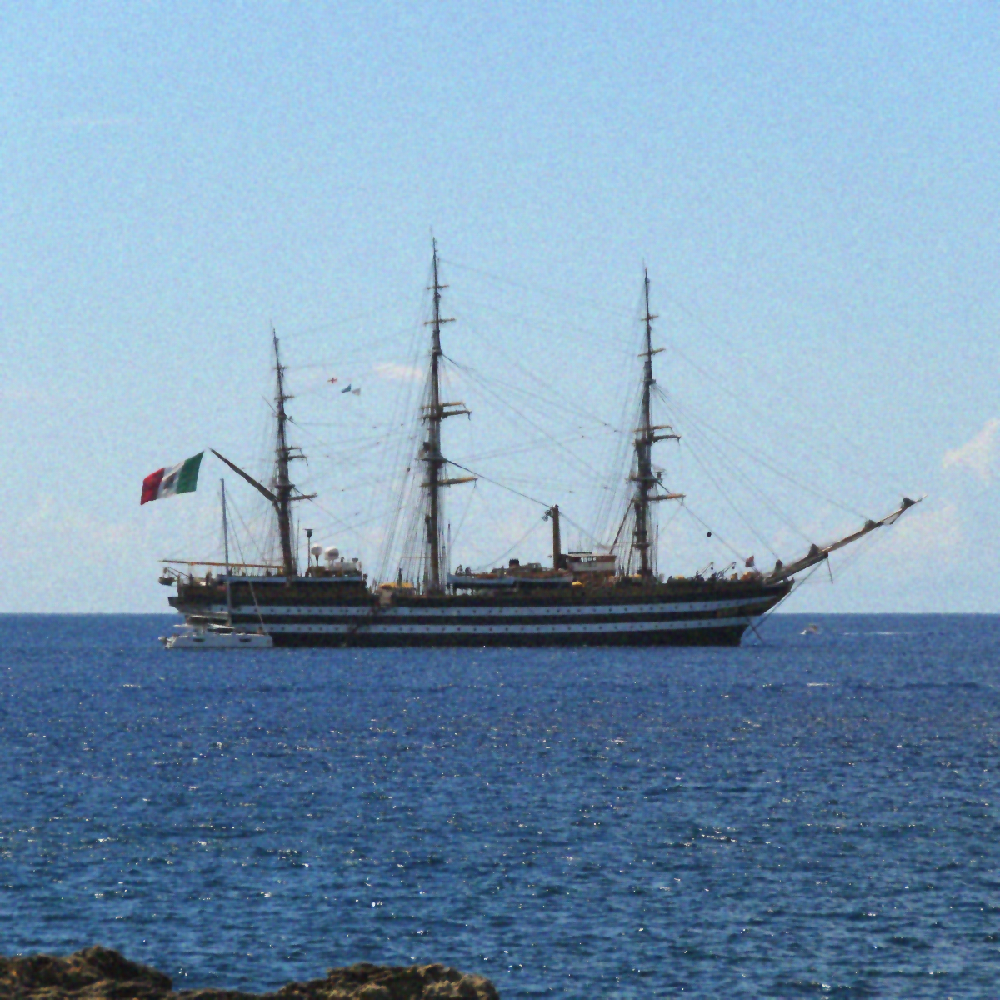
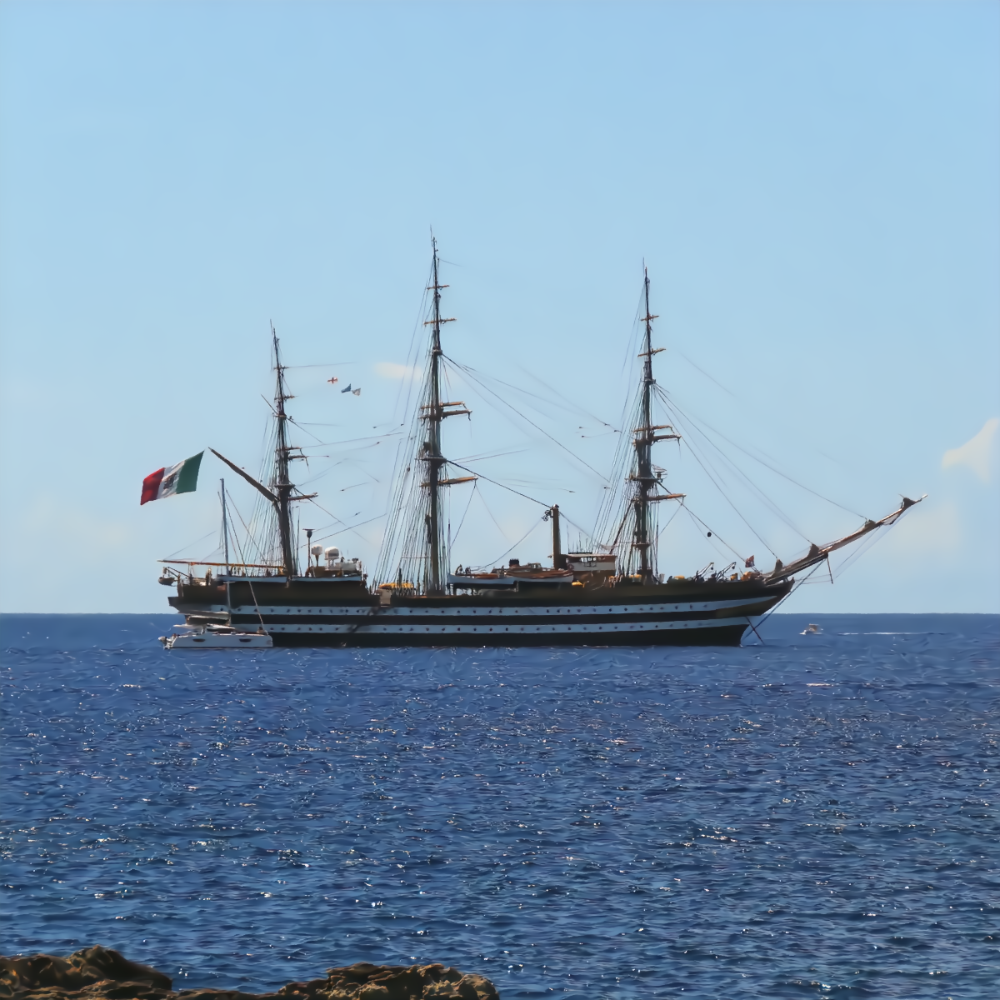
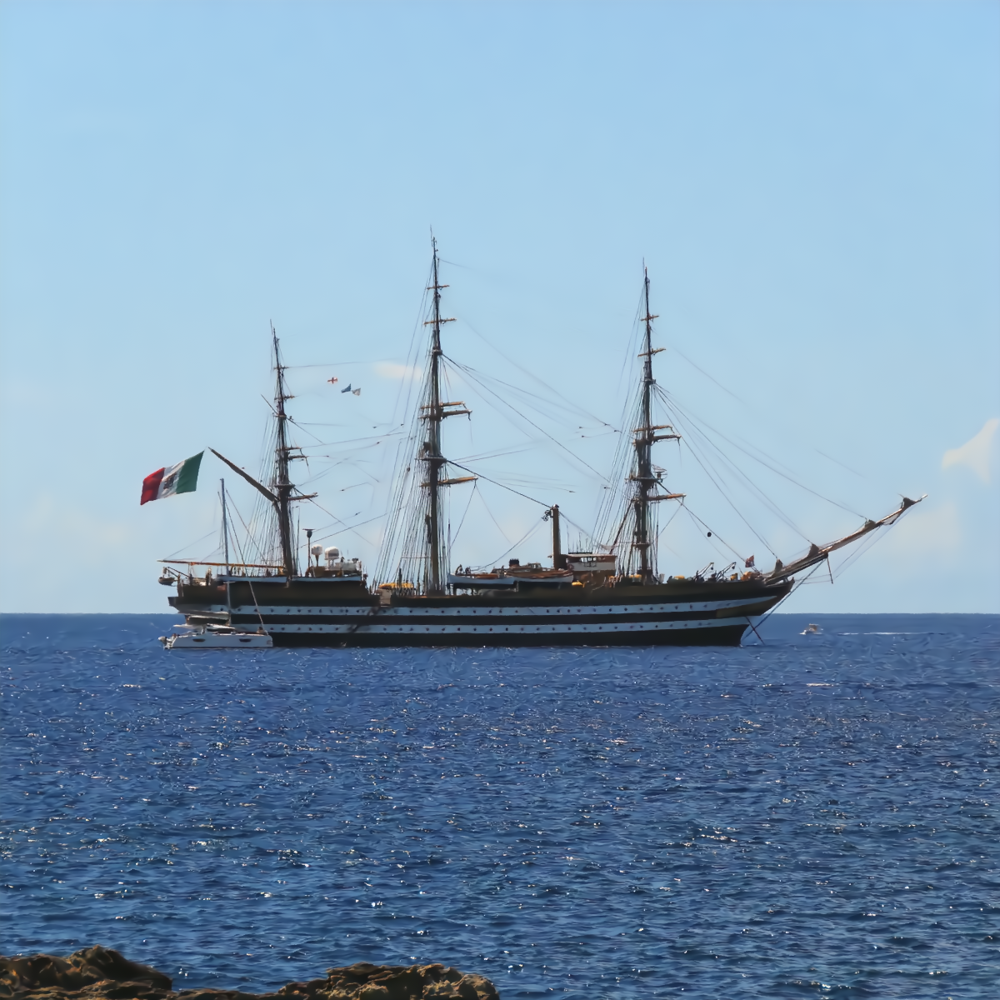

In [32]:
output_folder = f'test_pictures/{net_name}_{orig_name}_{t}'
step_size = [1, 5]
rec_images = reconstruct_and_compare(net, original_image, noisy_image, t, variance_schedule, device, output_folder=output_folder, step_size=step_size, use_plotly=True)

## Other images from the `Flowers102` test set

In [33]:
from matplotlib import image
from utils.diffusionDataset import get_alpha_bar

original_image = np.asarray(image.imread('test_pictures/flower_1.jpg'), dtype=np.float32)/255
orig_name = "flower_1"

original_image = original_image.transpose(2, 0, 1)

image_size_test = original_image.shape[1:]

t = 50

a = get_alpha_bar(variance_schedule)[t]
noisy_image = np.sqrt(a)*original_image + np.sqrt(1-a)*np.random.normal(size=original_image.shape)
noisy_image = noisy_image.clip(0, 1)

T start = 50
Sampling done.
T start = 50
Sampling done.
original saved
noisy saved
baseline saved
step 1 saved
step 5 saved
1200 1800



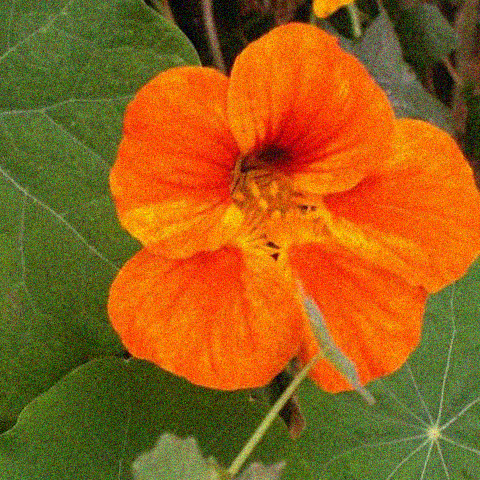
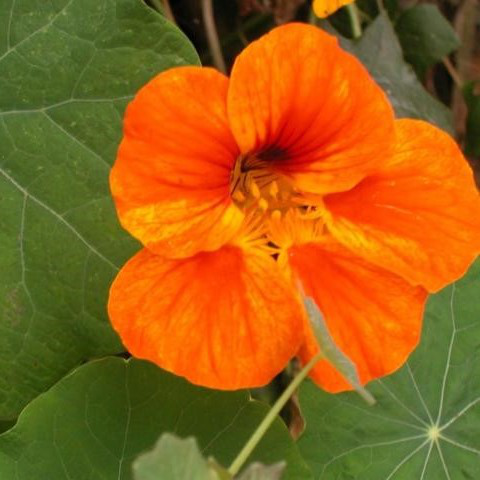
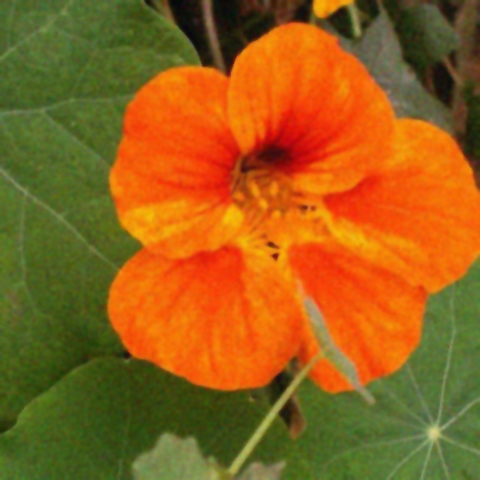
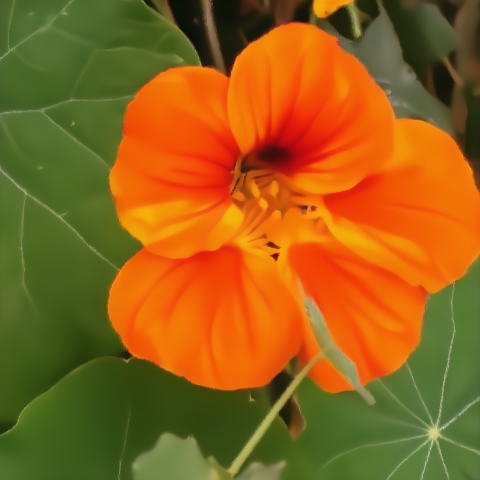
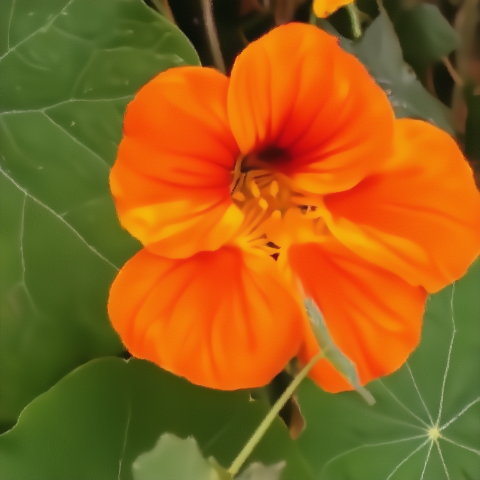

In [34]:
output_folder = f'test_pictures/{net_name}_{orig_name}_{t}'
step_size = [1, 5]
rec_images = reconstruct_and_compare(net, original_image, noisy_image, t, variance_schedule, device, output_folder=output_folder, step_size=step_size, use_plotly=True)

And another one

In [35]:
from matplotlib import image
from utils.diffusionDataset import get_alpha_bar

original_image = np.asarray(image.imread('test_pictures/flower_2.jpg'), dtype=np.float32)/255
orig_name = "flower_2"

original_image = original_image.transpose(2, 0, 1)

image_size_test = original_image.shape[1:]

t = 50

a = get_alpha_bar(variance_schedule)[t]
noisy_image = np.sqrt(a)*original_image + np.sqrt(1-a)*np.random.normal(size=original_image.shape)
noisy_image = noisy_image.clip(0, 1)

T start = 50
Sampling done.
T start = 50
Sampling done.
original saved
noisy saved
baseline saved
step 1 saved
step 5 saved
1200 1800



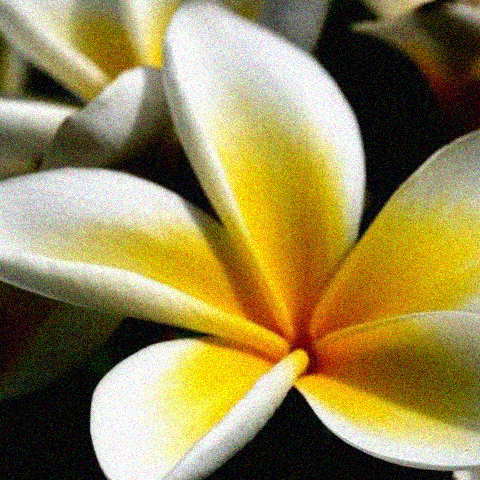
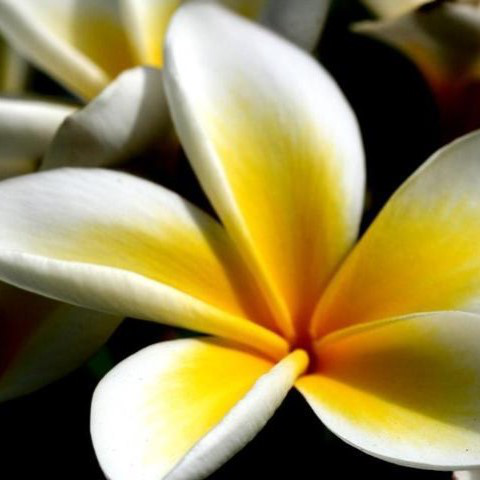
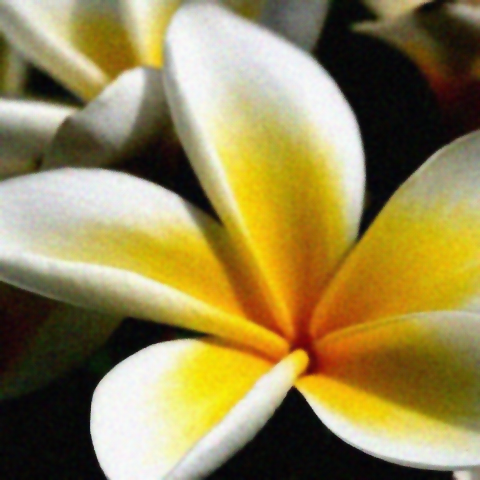
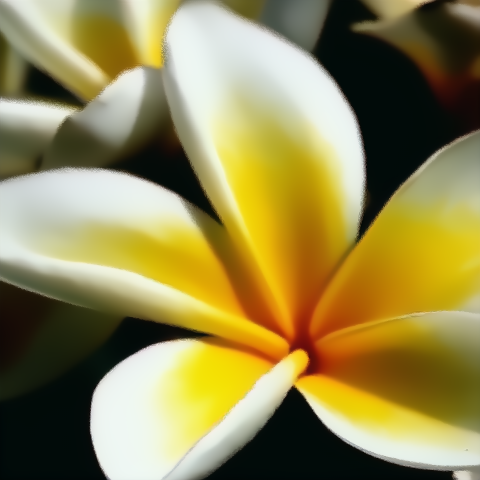
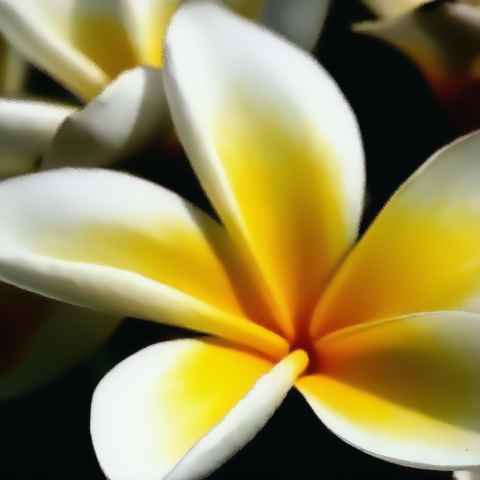

In [36]:
output_folder = f'test_pictures/{net_name}_{orig_name}_{t}'
step_size = [1, 5]
rec_images = reconstruct_and_compare(net, original_image, noisy_image, t, variance_schedule, device, output_folder=output_folder, step_size=step_size, use_plotly=True)

# Timestep prediction

Our diffusion model takes as input both the noisy image and the timestep $t$ for producing the estimated noise at that timestep. Using this noise, we can reconstruct the original non-noisy image. 

For a better application in a real-world scenario, we thought that it could be interesting to have another network which, given a noisy image, predicts which is the timestep $t$ associated to that image. Basically, a model which computes the most suitable timestep to use for that noisy image.

For this purpose, we deploy a simple neural network which consists of a stack of convolutional layers, which gradually downsample the image by means of a stride equal to $2$, and then some final linear layers, producing a single positive number in output. This output is the predicted timestep. The loss function is simply the *MSE*.

We train the model for $50$ epochs, with `AdamW` optimizer, with constant learning rate equal to $10^{-3}$.

Device: cpu
Loading checkpoint: checkpoints/Model\checkpoint_0040.ckpt
Checkpoint loaded.
 
Epoch: 41/50
	Train 193/193, 124s 641ms/step, lr: 0.001, loss: 515                                  
	Val 16/16, 8s 528ms/step, loss: 3.06e+03                                            
Epoch: 42/50
	Train 193/193, 113s 587ms/step, lr: 0.001, loss: 432                                  
	Val 16/16, 11s 670ms/step, loss: 494                                                
Epoch: 43/50
	Train 193/193, 125s 647ms/step, lr: 0.001, loss: 576                                  
	Val 16/16, 8s 523ms/step, loss: 1.88e+03                                            
Epoch: 44/50
	Train 193/193, 122s 634ms/step, lr: 0.001, loss: 522                                  
	Val 16/16, 11s 657ms/step, loss: 178                                                
Epoch: 45/50
	Train 193/193, 172s 889ms/step, lr: 0.001, loss: 542                                  
	Val 16/16, 11s 675ms/step, loss: 1.18e+03                 

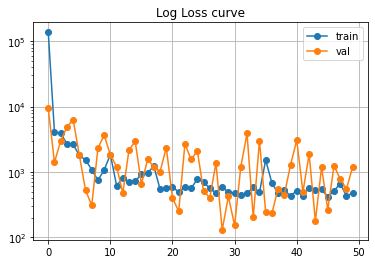

In [ ]:
from models.timestep_prediction_model import TimestepModel
from utils.training_timestep_prediction import train_model

from torch.optim.lr_scheduler import OneCycleLR
from torch.optim import AdamW
from functools import partial

net = TimestepModel(img_shape=(3,)+image_size, device=device)

epochs = 10
additional_info = {'batch_size': batch_size,
                   'image_size': image_size,
                   'variance_schedule': variance_schedule
                  }

checkpoint_dict = train_model(net=net,
                              dataloader_train=dataloader_train,
                              dataloader_val=dataloader_val,
                              loss_function=torch.nn.MSELoss(),
                              epochs=epochs,
                              optimizer=partial(AdamW, lr=0.001),
                              device=device,
                              checkpoint_folder='checkpoints/' + f'{type(net)}'.split('.')[-1][:-2],
                              clear_previous_checkpoints=True,
                              additional_info=additional_info)

plt.plot(checkpoint_dict['loss_history'], 'o-', label='train')
plt.plot(checkpoint_dict['loss_history_val'], 'o-', label='val')
plt.yscale('log')
plt.grid()
plt.title('Log Loss curve')
plt.legend()

plt.show()